# PythonによるscRNA-seq解析 その2

必要なデータのダウンロードとツールのインストール。

In [2]:
!pip install scanpy python-igraph scikit-misc leidenalg scvelo cellrank

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.0 MB 30.2 MB/s 
     |████████████████████████████████| 8.8 MB 41.0 MB/s 
     |████████████████████████████████| 1.3 MB 54.1 MB/s 
     |████████████████████████████████| 219 kB 45.7 MB/s 
     |████████████████████████████████| 250 kB 71.3 MB/s 
     |████████████████████████████████| 88 kB 7.0 MB/s 
     |████████████████████████████████| 9.4 MB 52.8 MB/s 
     |████████████████████████████████| 96 kB 4.8 MB/s 
     |████████████████████████████████| 965 kB 34.5 MB/s 
     |████████████████████████████████| 295 kB 54.1 MB/s 
     |████████████████████████████████| 1.1 MB 56.1 MB/s 
     |████████████████████████████████| 3.3 MB 48.1 MB/s 
     |████████████████████████████████| 4.8 MB 51.4 MB/s 
     |████████████████████████████████| 1.8 MB 51.2 MB/s 
     |████████████████████████████████| 68 kB 6.9 MB/s 
     |███████████████████████████████

In [3]:
!pip install --upgrade pandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 12.2 MB 20.4 MB/s 
  Attempting uninstall: pandas
    Found existing installation: pandas 1.3.5
    Uninstalling pandas-1.3.5:
      Successfully uninstalled pandas-1.3.5


ここでランタイムを再起動する！

In [1]:
!pip install --quiet scvi-colab
from scvi_colab import install
install()

     |████████████████████████████████| 237 kB 23.8 MB/s 
     |████████████████████████████████| 51 kB 2.2 MB/s 
INFO     scvi-colab: Installing scvi-tools.                                                                        
INFO     scvi-colab: Install successful. Testing import.                                                           


INFO:pytorch_lightning.utilities.seed:Global seed set to 0
/usr/local/lib/python3.8/dist-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/usr/local/lib/python3.8/dist-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
!git clone https://github.com/khigashi1987/scRNAseq_handson.git

fatal: destination path 'scRNAseq_handson' already exists and is not an empty directory.


In [3]:
%cd scRNAseq_handson

/content/scRNAseq_handson


In [4]:
! pip install --upgrade gdown
import gdown
url = 'https://drive.google.com/uc?id=1bfxDWrKB9kIxEITZWHCONBjEECDm1ngi'
output = 'data/retinal.h5ad'
gdown.download(url, output, quiet=False)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: gdown
    Found existing installation: gdown 4.4.0
    Uninstalling gdown-4.4.0:
      Successfully uninstalled gdown-4.4.0


Downloading...
From: https://drive.google.com/uc?id=1bfxDWrKB9kIxEITZWHCONBjEECDm1ngi
To: /content/scRNAseq_handson/data/retinal.h5ad
100%|██████████| 471M/471M [00:06<00:00, 70.8MB/s]


'data/retinal.h5ad'

In [5]:
url = 'https://drive.google.com/uc?id=1BrwkQ9i4j0MNRzuggkNeqiSGyHFVV7vy'
output = 'data/retinal_velo.loom'
gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1BrwkQ9i4j0MNRzuggkNeqiSGyHFVV7vy
To: /content/scRNAseq_handson/data/retinal_velo.loom
100%|██████████| 93.0M/93.0M [00:01<00:00, 71.8MB/s]


'data/retinal_velo.loom'

In [6]:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

import os
import numpy as np
import pandas as pd
import scanpy as sc
import scvi
import matplotlib.pyplot as plt
import seaborn as sns

sc.settings.verbosity = 3
sc.logging.print_header()
sc.settings.set_figure_params(dpi=100, facecolor='white')

scanpy==1.8.2 anndata==0.8.0 umap==0.5.3 numpy==1.21.6 scipy==1.7.3 pandas==1.5.2 scikit-learn==1.0.2 statsmodels==0.12.2 python-igraph==0.10.2 pynndescent==0.5.8


In [7]:
adata = sc.read_h5ad('./data/retinal.h5ad')

## Cell typeの自動推定

[CellAssign](https://doi.org/10.1038/s41592-019-0529-1)によるCell typeの自動推定。

Zhang, A.W., O’Flanagan, C., Chavez, E.A. et al. Probabilistic cell-type assignment of single-cell RNA-seq for tumor microenvironment profiling. Nat Methods 16, 1007–1015 (2019).

CellAssignは、事前知識としてCell typeの種類と、そのCell typeを識別するマーカー遺伝子の組み合わせの情報を使って、それぞれの細胞がいずれのCell typeに割り当てられるのか（あるいは"unassigned"か）の確率分布を計算してくれるツール。

観測された値が、cell type, library size, batchの影響を受けると仮定。

入力は遺伝子のカウントと、マーカー遺伝子・cell typeの対応のテーブル。発現量の閾値などの設定は必要ない。マーカーとcell typeの対応が0/1で表現されていればオーケー。

基本的には、scVIと似たような負の二項分布のモデリング。バッチIDやライブラリサイズを取り込んで、細胞ごとにcell typeを表す潜在変数の確率分布をEMアルゴリズムで最尤推定する。オリジナルのR版はtensorflowで最適化しているが、scvi-toolsに取り込んで実装したバージョンではpytorchを使って最適化。

マーカー遺伝子の情報は、エキスパートの知識で与えるか、[CellMarker](http://bio-bigdata.hrbmu.edu.cn/CellMarker/)、[PanglaoDB](https://panglaodb.se)など、マーカー遺伝子のデータベースからとってきて用意する。

ここでは、CellMakerからダウンロードしたマウスのマーカー遺伝子全情報をまとめたエクセルファイルをダウンロードして、該当する組織（眼球・脳・胚）とアノテーションしたいCell typeに対応する遺伝子のリストを抽出し、0/1のテーブルにまとめている。エクセルファイルのサイズがでかいので講習では割愛。すでに処理済みの`eye_markers.csv`のテーブルを配布している。

In [9]:
%%script true
target_labels = ['Amacrine cell', 
                 'Cone photoreceptor cell',
                 'Horizontal cell',
                 'Late activated neural stem cell',
                 'Late neuroblast',
                 'Neural progenitor cell',
                 'Neuroblast',
                 'Photoreceptor cell',
                 'Retinal ganglion cell',
                 'Retinal progenitor cell']

all_markers = pd.read_excel('./models/marker_genes/Cell_marker_Mouse.xlsx')
eye_markers = all_markers[(all_markers['tissue_class'] == 'Eye') | \
                          (all_markers['tissue_class'] == 'Brain') | \
                          (all_markers['tissue_class'] == 'Embryo')]
eye_markers = eye_markers[['Symbol', 'cell_name']]
eye_markers = eye_markers[eye_markers['cell_name'].isin(target_labels)]
eye_markers['dummy'] = [1]*len(eye_markers)
eye_markers = eye_markers.dropna()
eye_markers = eye_markers.drop_duplicates(keep='first')
eye_markers = eye_markers.pivot(index='Symbol', columns='cell_name', values='dummy')
eye_markers = eye_markers.fillna(0).astype(int)
eye_markers.to_csv('./models/marker_genes/eye_markers.csv')

In [10]:
eye_markers = pd.read_csv('./models/marker_genes/eye_markers.csv', index_col=0)

以下のように、マーカー遺伝子対Cell typeの対応関係が0/1で表現されている。

In [11]:
eye_markers.head()

,Amacrine cell,Bipolar cell,Cone cell,Cone photoreceptor cell,Horizontal cell,Late activated neural stem cell,Late neuroblast,Müller glial cell,Neural progenitor cell,Neural stem cell,Neuroblast,Neuron,Photoreceptor cell,Retinal ganglion cell,Retinal progenitor cell,Rod photoreceptor cell,Rod photoreceptor precursor cell
Symbol,,,,,,,,,,,,,,,,,
4932438A13Rik,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
6330403K07Rik,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
Aars2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
Abca4,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
Abca5,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


CellAssignはライブラリサイズの情報が計算に必要。ここでは細胞に割り当てられたトータルリード数の、全細胞平均に対する比率で計算することにする。前処理段階で計算した 'total_counts' を流用しているが、カウントデータを使って足し算を計算しなおしてもいい。対数変換した値で足し算しちゃうとスケールが変わっておかしなことになっちゃうので注意。

In [12]:
adata.obs['size_factor'] = adata.obs['total_counts'].values / adata.obs['total_counts'].values.mean()

マーカー遺伝子のうち、高発現変動遺伝子とオーバーラップするものだけ抽出。（計算速度のため。時間に余裕があれば発現変動遺伝子に限定せず全部のマーカー遺伝子を使ってもいい）

該当のマーカー遺伝子の情報だけ取り出した新しい`anndata`オブジェクトを用意する。

In [13]:
eye_markers = eye_markers[np.isin(eye_markers.index, adata.var[adata.var['highly_variable'] == True].index)]
bdata = adata[:, eye_markers.index].copy()

モデルのセットアップ。ライブラリサイズやバッチに対応したラベルを指定して、カウントデータが格納されているレイヤーをセットする。

In [14]:
scvi.external.CellAssign.setup_anndata(bdata, 
    size_factor_key='size_factor',
    batch_key='batch',
    layer='counts')

学習の実行。やはり時間がかかるので講習では学習済みのモデルを配布。

In [15]:
%%script true
cellassign_model = scvi.external.CellAssign(bdata, eye_markers)
cellassign_model.train()

In [16]:
%%script true
cellassign_model.save('./models/cellassign/', overwrite=True)

In [17]:
cellassign_model = scvi.external.CellAssign.load('./models/cellassign', bdata)

INFO     File ./models/cellassign/model.pt already downloaded                                                      


細胞ごとのcell type確率の予測。

In [18]:
predictions = cellassign_model.predict()

In [19]:
predictions

,Amacrine cell,Bipolar cell,Cone cell,Cone photoreceptor cell,Horizontal cell,Late activated neural stem cell,Late neuroblast,Müller glial cell,Neural progenitor cell,Neural stem cell,Neuroblast,Neuron,Photoreceptor cell,Retinal ganglion cell,Retinal progenitor cell,Rod photoreceptor cell,Rod photoreceptor precursor cell
0,3.376599e-04,5.895629e-06,9.812665e-01,1.480903e-03,3.604459e-05,5.409688e-04,9.383034e-04,5.445538e-04,1.180385e-04,2.714216e-15,1.335013e-24,6.517411e-106,1.963789e-03,5.391997e-03,6.316957e-03,1.042139e-03,1.623581e-05
1,8.178778e-04,3.013952e-03,9.781281e-01,2.100749e-03,5.616672e-05,1.265442e-04,1.375039e-03,9.361648e-04,4.931543e-05,4.166674e-16,1.365678e-21,1.209643e-83,3.419927e-03,2.560188e-03,6.296753e-03,1.038806e-03,8.046374e-05
2,2.660053e-16,4.737028e-16,2.269205e-11,6.727371e-19,4.591848e-26,1.872102e-33,5.113711e-22,1.136622e-21,5.638754e-21,3.098262e-28,2.559535e-51,1.390883e-139,6.139165e-15,1.000000e+00,1.460813e-13,2.409974e-14,3.162411e-22
3,4.385756e-07,2.792256e-09,5.797536e-04,1.120042e-06,1.672435e-07,5.477194e-08,5.914494e-11,1.707186e-07,2.253600e-07,1.501606e-09,6.281428e-21,6.914016e-82,1.692987e-06,9.994120e-01,3.732196e-06,6.157184e-07,3.138582e-08
4,1.568833e-05,8.424272e-05,9.923665e-01,7.462969e-07,4.404270e-17,1.324441e-12,6.180864e-07,2.804698e-12,4.296175e-07,1.798462e-28,4.651498e-44,1.642679e-157,8.939292e-05,9.253567e-13,6.388414e-03,1.053928e-03,6.353789e-14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4558,6.411814e-25,8.926255e-26,8.253532e-20,4.507500e-23,7.205970e-31,1.726429e-27,1.250789e-20,2.686227e-33,1.311215e-24,5.897132e-36,1.697311e-52,1.384834e-128,2.900642e-23,1.000000e+00,5.313257e-22,8.765537e-23,5.307327e-32
4559,2.086323e-06,3.369549e-17,3.327671e-04,5.864553e-07,1.086238e-07,1.224153e-08,5.838407e-07,5.278301e-09,2.777906e-07,2.360489e-10,2.657855e-17,2.734170e-98,1.430603e-05,9.996468e-01,2.142207e-06,3.534102e-07,3.758060e-10
4560,6.734257e-06,5.110178e-09,8.428272e-01,6.674259e-04,1.263140e-10,2.121082e-15,1.312298e-04,4.909820e-13,1.038616e-05,1.172244e-14,1.265739e-29,3.324217e-159,4.182381e-04,1.496179e-01,5.425747e-03,8.951116e-04,2.495943e-11
4561,7.538313e-09,4.016624e-17,4.030476e-04,4.667848e-02,3.162194e-10,8.476129e-09,3.475742e-06,2.490872e-12,2.172408e-08,8.886891e-13,8.700514e-18,2.442650e-111,9.528133e-01,9.868672e-05,2.594641e-06,4.280504e-07,4.469339e-10


確率最大のcell typeを各細胞に割り当てる。

In [20]:
bdata.obs['CellAssign_prediction'] = predictions.idxmax(axis=1).values

UMAPで見ると以下のようにcell typeが分布している。

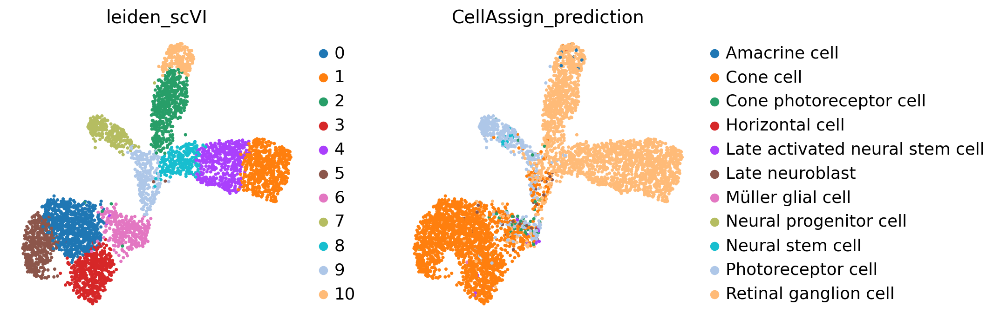

In [21]:
sc.pl.umap(
    bdata,
    color=['leiden_scVI', 'CellAssign_prediction'],
    frameon=False,
    ncols=2
)

## アトラスとの統合・ラベル転移

マーカー遺伝子を使ったアノテーションがあんまりうまくいってないっぽいので、今度は「リファレンスデータからのラベル転移」でやってみる。

高精度なアノテーションが付与されたシングルセル解析データが大量に蓄積されているアトラスとして、マウスの場合はたとえば[Tabula Muris](https://tabula-muris.ds.czbiohub.org), [Tabula Muris Senis](https://tabula-muris-senis.ds.czbiohub.org)がある。

ただどちらにも欲しい組織（網膜発生プロセス）が欲しい解像度で収載されていない。

ここでは、別の論文のデータを使う。網膜神経系発生について、胚から産後まで10個のタイムポイントで大量の細胞（10万以上）を対象にシングルセル解析したデータ。

Clark, Brian S., et al. "Single-cell RNA-seq analysis of retinal development identifies NFI factors as regulating mitotic exit and late-born cell specification." Neuron 102.6 (2019): 1111-1126.
[https://doi.org/10.1016/j.neuron.2019.04.010](https://doi.org/10.1016/j.neuron.2019.04.010)

この論文の素晴らしいところは、すべての細胞の遺伝子発現カウントデータとcell typeのアノテーションを[公開してくれている](https://github.com/gofflab/developing_mouse_retina_scRNASeq)ところ。

マウス網膜神経発生アトラスといって差し支えないこのデータを活用して、ここまで扱ってきたデータとの統合解析を実行し、アトラスに付与されたcell typeアノテーションをラベル転移（Label transfer）する。

ラベル転移の半教師あり学習には [scANVI](https://docs.scvi-tools.org/en/stable/user_guide/models/scanvi.html#ref1) を使う。確率モデルの詳細は以下の論文を参照。

Xu, Chenling, et al. "Probabilistic harmonization and annotation of single‐cell transcriptomics data with deep generative models." Molecular systems biology 17.1 (2021): e9620. [https://doi.org/10.15252/msb.20209620](https://doi.org/10.15252/msb.20209620)

scANVIはscvi-toolsにモデルのひとつとして実装されている。

めっちゃデカいファイルで、GPU使わない場合は学習にも時間かかるので、データ読み込みと学習については講習では全部スキップ。学習されたモデルからラベルを予測した結果だけcsvファイルで配布する。

リファレンスデータの読み込み。マトリックス、遺伝子メタデータ、細胞メタデータがそれぞれ個別にファイルとして置いてあるので、それぞれ読み込んでひとつのanndataに統合する。

In [22]:
%%script true
mtx = sc.read_mtx('./ref_data/10x_mouse_retina_development.mtx')
refdata = mtx.transpose()
refdata.obs = pd.read_csv('./ref_data/10x_Mouse_retina_pData_umap2_CellType_annot_w_horiz.csv')
refdata.obs = refdata.obs.set_index('barcode')
refdata.var = pd.read_csv('./ref_data/10x_mouse_retina_development_feature.csv')
refdata.var = refdata.var.set_index('gene_short_name')

リファレンスデータのUMAP座標は計算済みのやつが細胞メタデータに記載されているので、`scanpy.pl.umap`で自動で読み込めるように、`obsm`の中に入れておく。このリファレンスデータの全体像がさくっと確認できる。

In [23]:
%%script true
refdata.obsm['X_umap'] = refdata.obs[['umap_coord1', 'umap_coord2']].values
sc.pl.umap(refdata, 
           color='umap2_CellType',
           frameon=False)

クエリデータ（ここまで扱ってきたデータ）を **カウントデータ** として用意する。scANVIはscVIと同様、カウントデータを学習する確率モデルであるため。別レイヤーに取っておいたカウントのデータから新しいanndataを作る。

リファレンスデータは 'sample' のラベルのところに別々のタイムポイントからとったサンプルのラベルが記載されている。これをバッチと捉えてバッチ補正を行いたいので、クエリ側のバッチラベル（"E2", "F2"）もここに記述しておく。

In [24]:
%%script true
from anndata import AnnData
query = AnnData(X=adata.layers['counts'], obs=adata.obs, var=adata.var)
query.obs['sample'] = query.obs['batch']

リファレンスとクエリのデータをひとつのanndataにまとめる。

In [25]:
%%script true
refdata.var_names_make_unique()
alldata = refdata.concatenate(query)

前半でやったのと同じような、シングルセル解析の前処理をデータ全体に対して実行する。

In [26]:
%%script true
alldata.layers['counts'] = alldata.X.copy()
sc.pp.normalize_per_cell(alldata, counts_per_cell_after=1e4)
sc.pp.log1p(alldata)
alldata.raw = alldata

In [27]:
%%script true
sc.pp.highly_variable_genes(alldata, flavor='seurat_v3', n_top_genes=2000, layer='counts', batch_key='sample')

scVIを利用してデータ全体のバッチ補正を行う統合モデルを学習する。CPUで学習する場合は時間かかるので昼食でもとりにいく。帰ってきたら学習終わってる、くらいの計算時間で済むはず。

In [28]:
%%script  true
scvi.model.SCVI.setup_anndata(alldata, layer='counts', batch_key='sample')

In [29]:
%%script true
integration_model = scvi.model.SCVI(alldata)
integration_model.train()

In [30]:
%%script true
integration_model.save('./models/integration_model')

In [31]:
%%script true
integration_model = scvi.model.SCVI.load('./models/integration_model', alldata)

リファレンス側のデータでcell typeが記述されているカラム（'umap2_CellType'）が、クエリ側のデータでは現在 NaN になっているので、ここを全部 'Unknown' にセットしておく。

In [32]:
%%script true
alldata.obs['umap2_CellType'] = alldata.obs['umap2_CellType'].cat.add_categories('Unknown')
alldata.obs = alldata.obs.fillna({'umap2_CellType':'Unknown'})

統合モデル、統合データ、未知ラベルのカラムと名前を指定してscANVIモデルをセットアップする。

In [33]:
%%script true
label_model = scvi.model.SCANVI.from_scvi_model(integration_model,
                                                adata=alldata,
                                                unlabeled_category='Unknown',
                                                labels_key='umap2_CellType')

ラベル転移の学習を実行する。ここはそれほど計算時間かからない（ようにパラメータを設定しているが精度はじゅうぶん出る）

In [34]:
%%script true
label_model.train(n_samples_per_label=100)
label_model.save('./models/label_transfer')

In [35]:
%%script true
label_model = scvi.model.SCANVI.load('./models/label_transfer/', alldata)

学習されたモデルでcell typeの予測を実行する。

In [36]:
%%script true
alldata.obs['predicted_celltype'] = label_model.predict(alldata)

この予測結果全体からクエリ側に対応するデータだけ抜き出して、以下のようにcsvとして保存したのが配布しているデータ。

In [37]:
%%script true
predictions = alldata.obs[(alldata.obs['sample'] == 'E2') | (alldata.obs['sample'] == 'F2')]['predicted_celltype']
predictions.index = predictions.index.str[:-2]
predictions.to_csv('./models/label_transfer/celltype_predictions.csv')

csvファイルをロード。

In [38]:
predictions = pd.read_csv('./models/label_transfer/celltype_predictions.csv', index_col=0)

adataに予測されたラベルを格納。

In [39]:
adata.obs['predicted_celltype'] = predictions.loc[adata.obs.index, 'predicted_celltype']

予測されたラベルの細胞数カウントは以下。それっぽいラベルが並んでいる。

In [40]:
adata.obs['predicted_celltype'].value_counts()

Retinal Ganglion Cells      1198
Late RPCs                   1118
Neurogenic Cells             635
Amacrine Cells               517
Early RPCs                   489
Horizontal Cells             263
Photoreceptor Precursors     218
Cones                        102
Bipolar Cells                 16
Rods                           7
Name: predicted_celltype, dtype: int64

以下が予測結果で色分けしたUMAP。

RPCs は Retinal Progenitor Cells の略。

RPCs からNeurogenicにつながって、Photoreceptor/Conesに分岐していく流れと、Amacrine/Horizontalに分岐していく流れと、Retinal ganglion cellsに分岐する3つの流れに分かれていることがわかった。

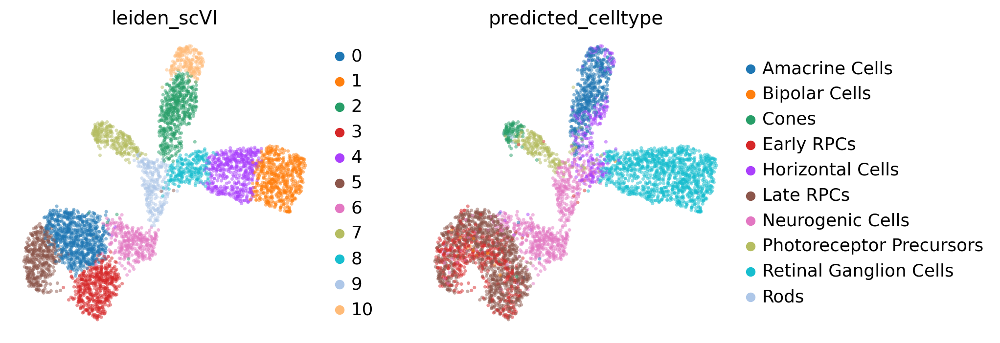

In [41]:
sc.pl.umap(adata,
    color=['leiden_scVI', 'predicted_celltype'],
    frameon=False, alpha=0.5,
    ncols=2)

Leidenクラスタに名前をつけたいので、それぞれのクラスタに所属している細胞がどのcell typeラベルを持っているのか、数をクロス集計してみる。

In [42]:
pd.crosstab(adata.obs['leiden_scVI'], adata.obs['predicted_celltype'])

predicted_celltype,Amacrine Cells,Bipolar Cells,Cones,Early RPCs,Horizontal Cells,Late RPCs,Neurogenic Cells,Photoreceptor Precursors,Retinal Ganglion Cells,Rods
leiden_scVI,,,,,,,,,,
0,0,10,2,177,3,536,63,0,0,0
1,1,0,0,0,0,0,0,0,600,0
2,359,0,0,0,122,0,9,16,0,0
3,1,1,1,100,0,382,7,0,0,0
4,0,0,0,0,1,0,1,0,488,0
5,0,3,0,205,0,198,15,0,0,0
6,0,0,0,2,1,2,320,0,0,0
7,0,0,99,2,0,0,0,151,0,7
8,0,1,0,2,86,0,36,10,109,0


このカウントを元に、多数決で以下のような適当な名前をつけた。

In [43]:
leiden_to_celltypes = {
    '0':'Late-RPCs-1', '1':'RGCs-3',
    '2':'A/H-1', '3':'Late-RPCs-2', '4':'RGCs-2',
    '5':'Early-RPCs', '6':'Neurogenic-1',
    '7':'Photoreceptors',
    '8':'RGCs-1',
    '9':'Neurogenic-2',
    '10':'A/H-2'}

adata.obs['leiden_celltypes'] = [leiden_to_celltypes[v] for v in adata.obs['leiden_scVI'].values]

名前がついたLeidenクラスタを可視化してみる。

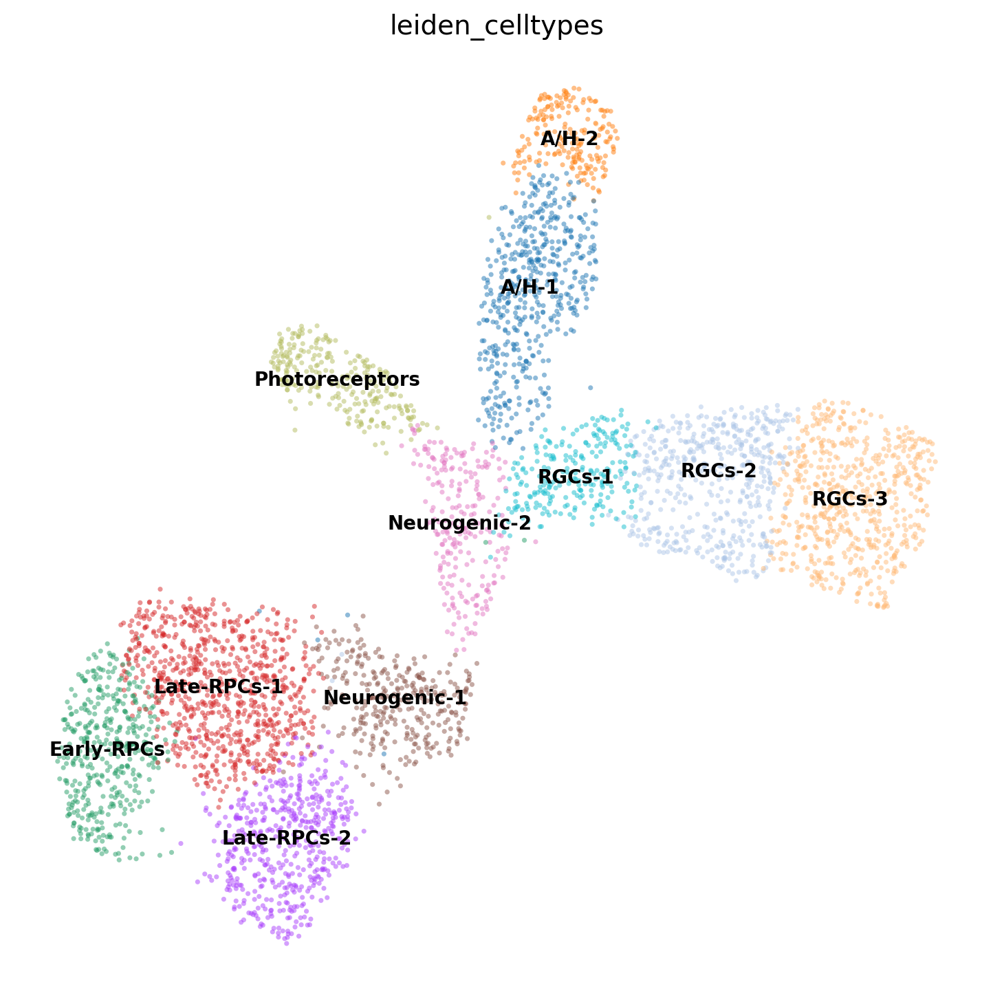

In [44]:
with plt.rc_context({"figure.figsize": (9, 9)}):
    sc.pl.umap(adata,
        color='leiden_celltypes',
        legend_fontsize=10,
        frameon=False, alpha=0.5,
        legend_loc='on data')

## RNA速度の推定

### 事前準備（velocyto）

scVeloを使うためには、spliced/unsplicedの二種類のカウントデータが必要となる。

なので事前に [velocyto](http://velocyto.org/velocyto.py/index.html) を使って、Cell Rangerが生成したゲノムマッピングのBAMファイルから、spliced/unsplicedのカウントデータを作っておく。

バッチごとに実行して、それぞれのバッチに属する細胞のspliced/unsplicedカウントを格納した [loom](https://linnarssonlab.org/loompy/index.html) データを作る。

計算に時間がかかるので、講習ではすでにvelocyto計算済みの結果を配布している。

velocytoは以下のコマンドで実行する。

```bash
velocyto run10x \
    -m /path/to/Cell_Ranger_References/mm10_rmsk.gtf \
    /path/to/RetinalBatchE2 \
    /path/to/Cell_Ranger_References/refdata-gex-mm10-2020-A/genes/genes.gtf

velocyto run10x \
    -m /path/to/Cell_Ranger_References/mm10_rmsk.gtf \
    /path/to/RetinalBatchF2 \
    /path/to/Cell_Ranger_References/refdata-gex-mm10-2020-A/genes/genes.gtf
```

velocytoでバッチごとに推定したloomファイルを統合して書き出す。ここの統合処理も時間かかるので、統合後のデータを配布。

In [45]:
%%script true
import loompy
loompy.combine(['./data/RetinalBatchE2/velocyto/RetinalBatchE2.loom',
                './data/RetinalBatchF2/velocyto/RetinalBatchF2.loom'],
               output_file='./data/retinal_velo.loom')

In [46]:
import scvelo as scv
scv.set_figure_params()

spliced/unsplicedのカウントデータを遺伝子発現テーブルと統合する。細胞のバーコードで紐づけるので、長さの指定（インデックスのどの部分がバーコードか）が必要になることに注意。

In [47]:
ldata = scv.read('./data/retinal_velo.loom', cache=True)

# id_lengthは細胞を区別するバーコード配列の長さ。事前に確認しておく
# また、scVIのmerge関数は勝手にこれまでのクラスタの色指定をリセットしちゃうので一時退避させて再設定しておく
# 'uns'(unstructured)は特に構造の決まってない雑多なメタデータを格納しておく場所。
cluster_colors = adata.uns['leiden_celltypes_colors']
adata = scv.utils.merge(adata, ldata, id_length=16)
adata.uns['leiden_celltypes_colors'] = cluster_colors

... writing an h5ad cache file to speedup reading next time


scVeloの関数で、遺伝子ごとのspliced/unsplicedカウントの比率を表示できる。実験プラットフォームにもよるが、だいたいunsplicedが25%程度らしい。クラスタごとにも表示。極端にunsplicedがとれてないクラスタがあるかどうかチェックする。

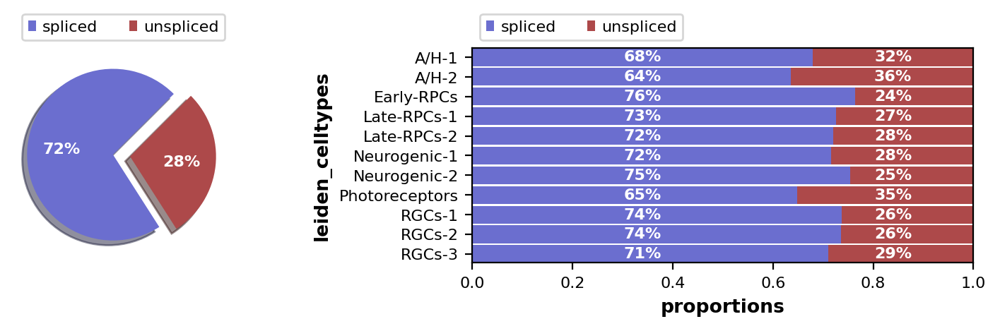

In [48]:
scv.pl.proportions(adata, groupby='leiden_celltypes')

速度計算を実行する。近傍グラフの構成から。

In [49]:
# scVI補完の潜在空間上で近傍グラフ構成、一次・二次モーメント計算
scv.pp.moments(adata, use_rep='X_scVI')

Normalized count data: spliced, unspliced.
computing moments based on connectivities
    finished (0:00:04) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


Splicing kineticsモデルのパラメータ推論。

In [50]:
scv.tl.velocity(adata, mode='stochastic')

computing velocities
    finished (0:00:06) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


速度ベクトルを元に、細胞から細胞への遷移確率を計算。

In [51]:
scv.tl.velocity_graph(adata)

computing velocity graph (using 1/2 cores)


  0%|          | 0/4563 [00:00<?, ?cells/s]

    finished (0:00:25) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


速度ベクトルから構成した「流れ」をプロットしてみる。

computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


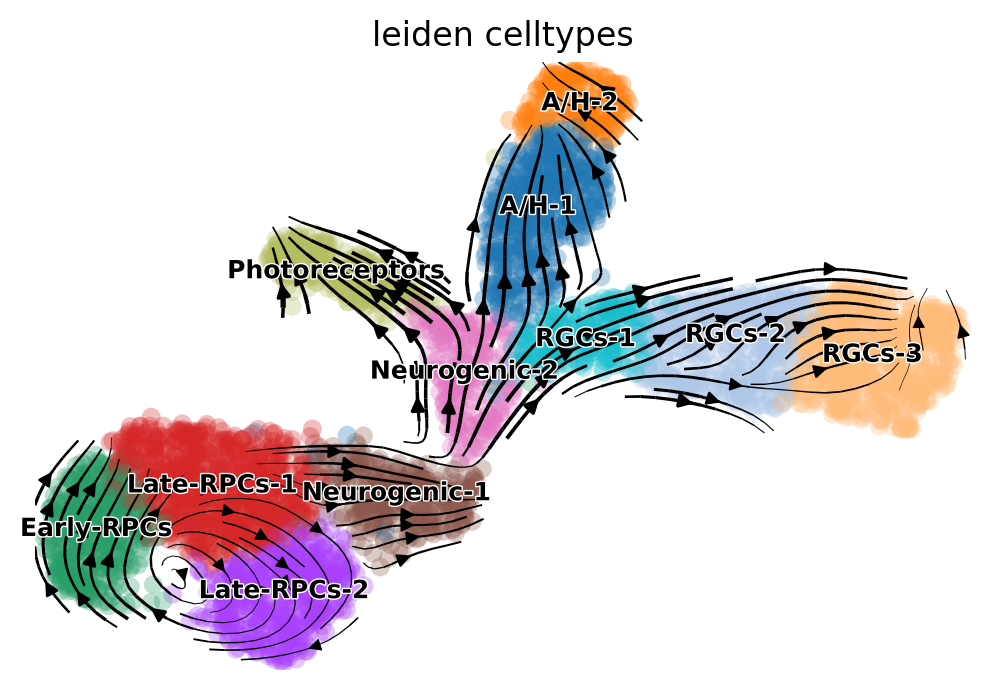

In [52]:
scv.pl.velocity_embedding_stream(adata, 
        basis='X_umap', color='leiden_celltypes',
        legend_fontsize=9,
        smooth=0.8, min_mass=4)

Progenitorの集団からはじまって、わかりやすい三分岐。

RNA速度を計算することによって、トランスクリプトームパターンの幾何学的な近接性だけで推定された 'Pseudo time' ではなく、速度情報をちゃんと織り込んだ細胞の 'Latent time' を計算できる。

In [ ]:
scv.tl.recover_dynamics(adata, n_jobs=1)
scv.tl.recover_latent_time(
    adata,
    root_key='initial_states_probs', 
    end_key='terminal_states_probs')

recovering dynamics (using 1/2 cores)


  0%|          | 0/798 [00:00<?, ?gene/s]

    finished (0:09:35) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing terminal states
    identified 0 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:03) --> added 
    'latent_time', shared time (adata.obs)


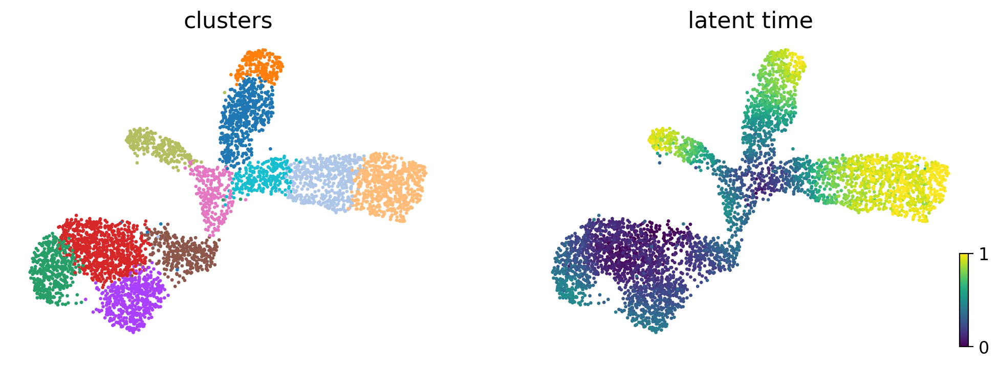

In [ ]:
scv.pl.scatter(
    adata,
    color=['leiden_celltypes', 'latent_time'],
    fontsize=16,
    cmap='viridis',
    perc=[2, 98],
    colorbar=True,
    rescale_color=[0, 1],
    title=['clusters', 'latent time'])

Progenitorの部分がごちゃごちゃしてわかりにくいので、取り出して個別に解析してみる。

どうもグルグルとまわってるみたいなので、細胞周期のマーカー遺伝子発現をチェック。

In [ ]:
prog = adata[adata.obs['leiden_celltypes'].isin(['Early-RPCs', 'Late-RPCs-1', 'Late-RPCs-2'])].copy()

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


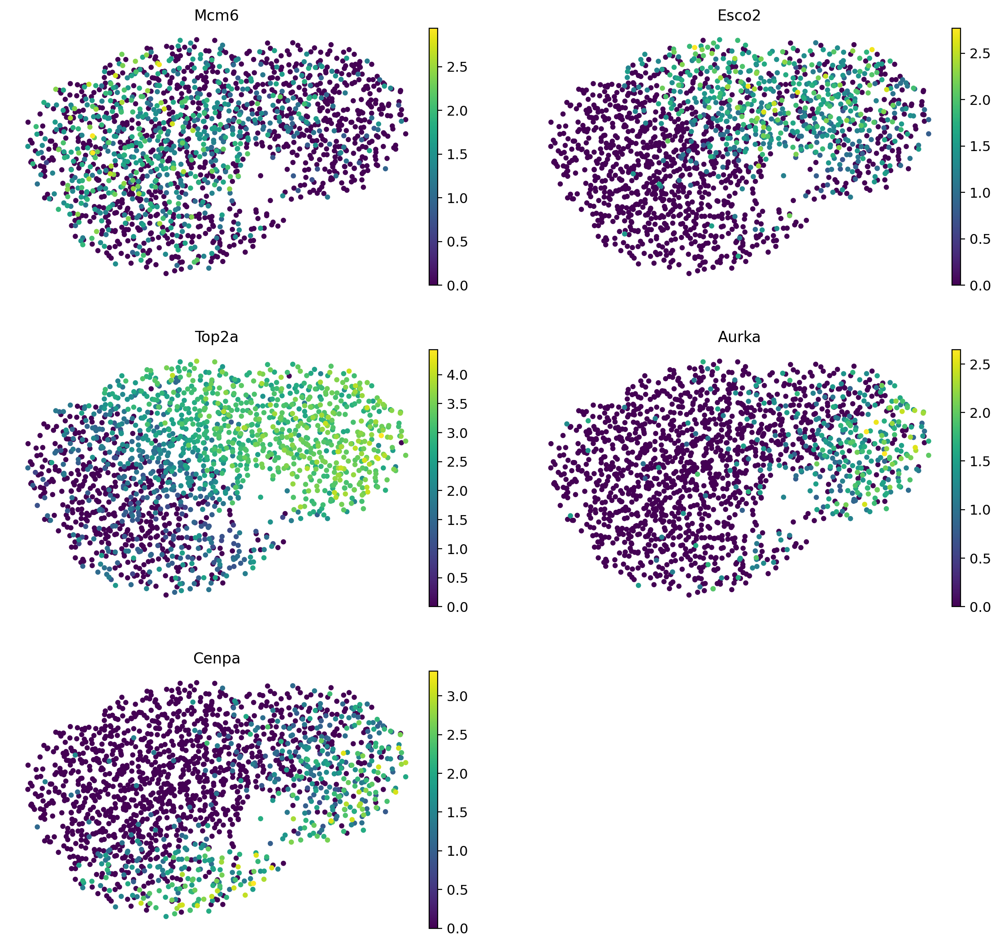

In [ ]:
sc.pp.neighbors(prog, use_rep="X_scVI", n_neighbors=50)
sc.tl.umap(prog, min_dist=1.0)
sc.pl.umap(prog, 
           ncols=2,
           color=['Mcm6', 'Esco2', 'Top2a', 'Aurka', 'Cenpa'],
           cmap='viridis',
           frameon=False)

というわけで、このグルグルは細胞周期を反映しているのだった。

この中だけで速度を描くとよりわかりやすい。

computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/2 cores)


  0%|          | 0/1704 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


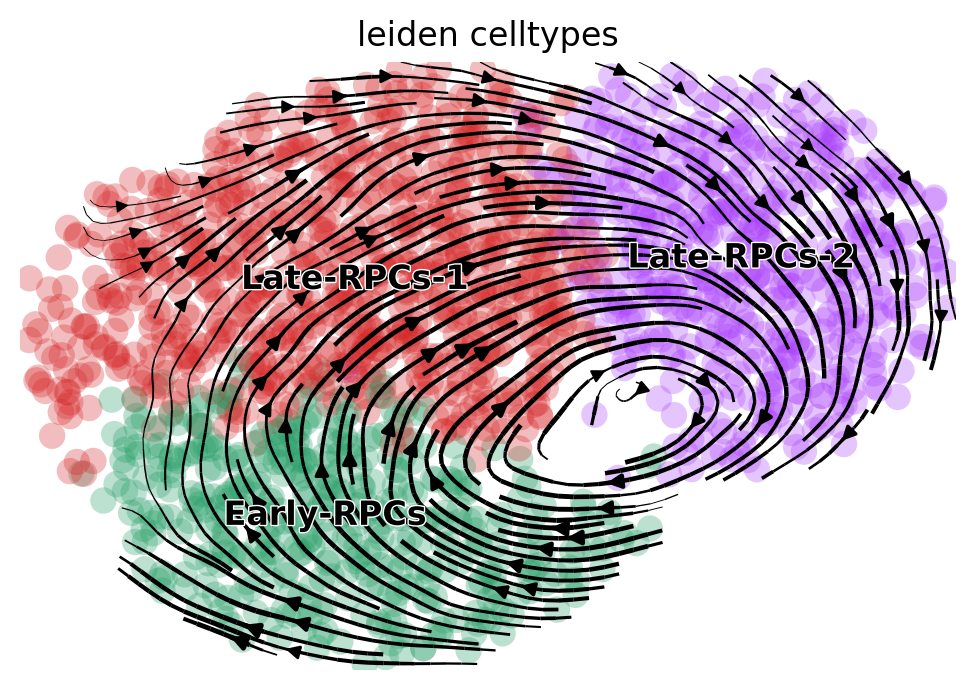

In [ ]:
scv.pp.moments(prog, use_rep='X_scVI')
scv.tl.velocity(prog, mode='stochastic')
scv.tl.velocity_graph(prog)
scv.pl.velocity_embedding_stream(prog, 
    basis='X_umap', color='leiden_celltypes',
    smooth=0.8, min_mass=4)

「膨らみ方」（splicing kinetics）は遺伝子ごとに異なる。scVeloのscatter関数では遺伝子ごとに、具体的にどのようなダイナミクスが推定されたのかプロットしてくれる。それぞれの遺伝子がそれぞれ異なるタイミング、異なるパターンで、induction => steady-state => repressionのパスを巡っている。

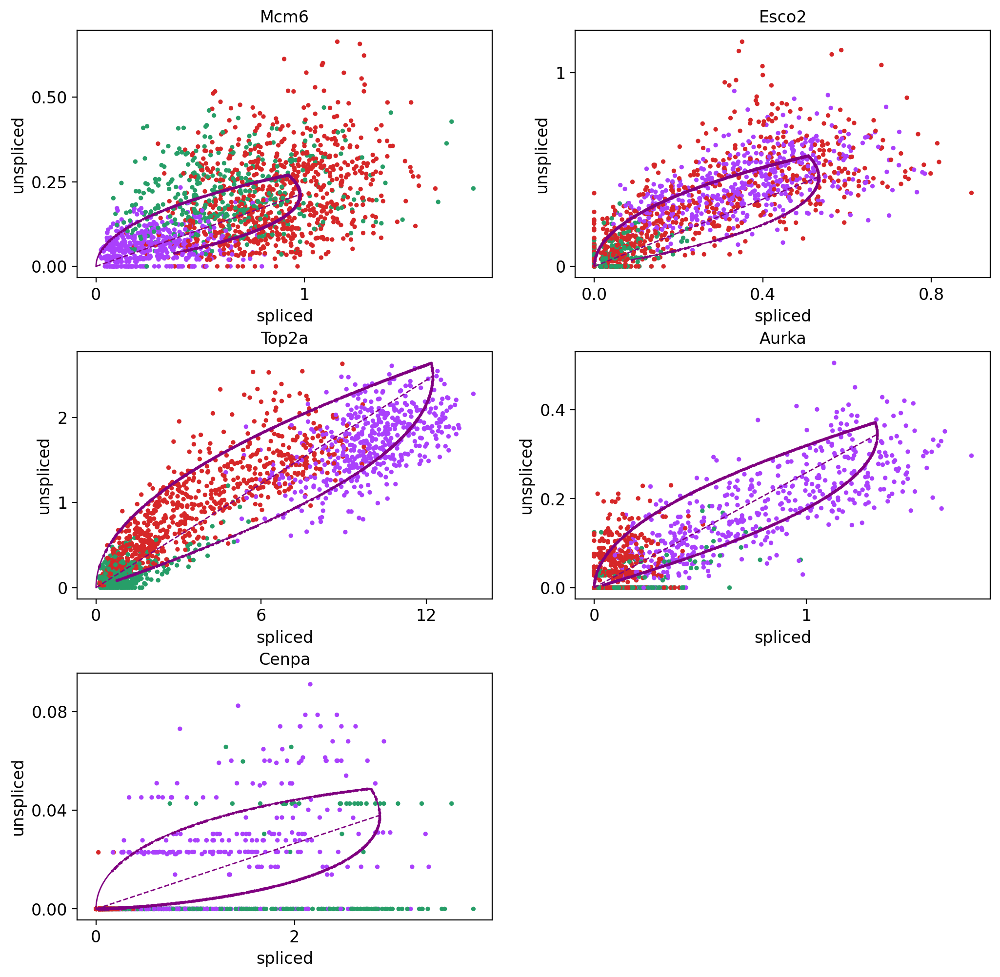

In [ ]:
scv.pl.scatter(prog, 
               ['Mcm6', 'Esco2', 'Top2a', 'Aurka', 'Cenpa'],
               ncols=2,
               color='leiden_celltypes')

細かく見ると印象が違ってくることもあるので、流れの全体像として粗視化されたパターンだけでなく、それぞれの速度をつぶさに見ていくことも大事。

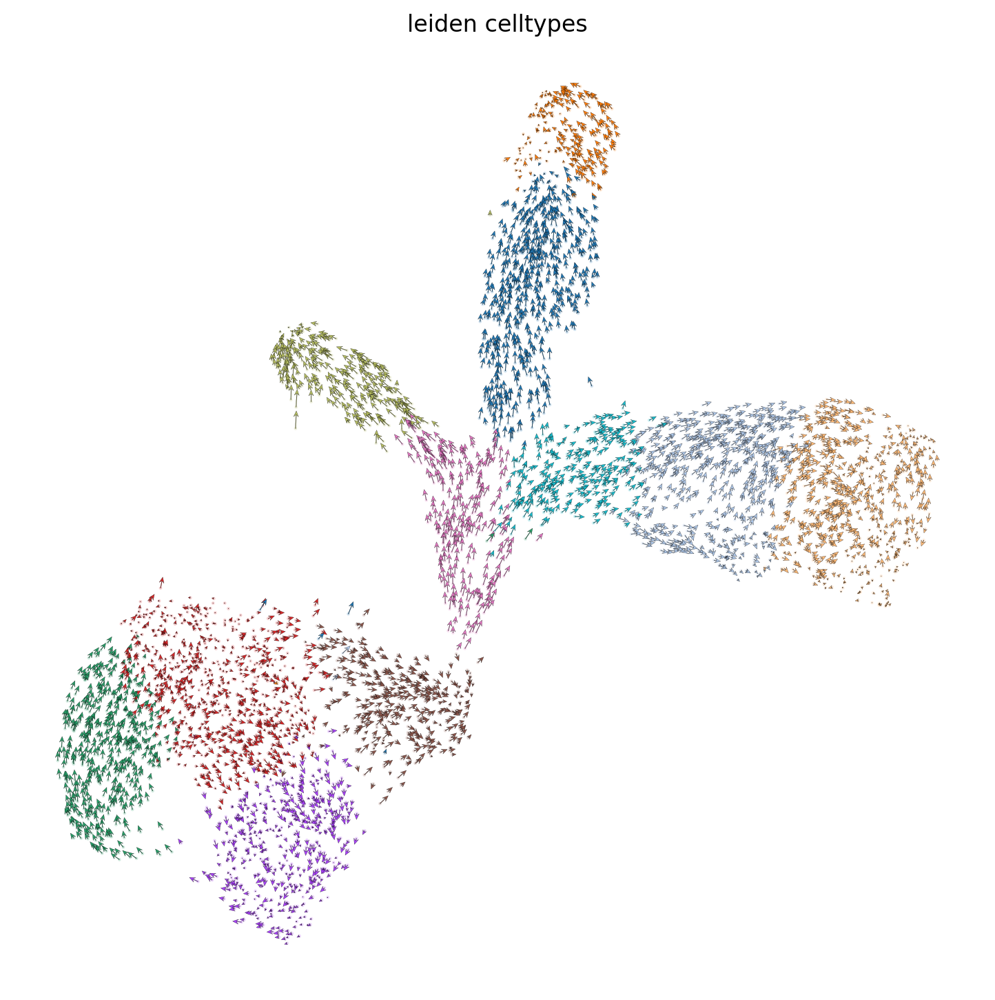

In [ ]:
scv.pl.velocity_embedding(adata, figsize=(9, 9),
        basis='X_umap', color='leiden_celltypes',
        scale=0.5)

## 細胞運命の推定

Trajectoryを推定するツールは数多あるが、幾何学的な近接性だけではなくRNA速度情報も考慮に入れて道筋を推定するツールはあまり多くない。

ここでは、幾何学的近接性をベースにしたTrajectory解析のロバスト性と、RNA速度による方向情報を組み合わせることによって、方向づけされた、確率的な状態変化の軌跡を推定するツール、 **CellRank** を使ってみる。

Lange, Marius, et al. "CellRank for directed single-cell fate mapping." Nature methods 19.2 (2022): 159-170.
[https://doi.org/10.1038/s41592-021-01346-6](https://doi.org/10.1038/s41592-021-01346-6)

近傍グラフ上で細胞それぞれを状態としたマルコフ連鎖を考え、速度ベクトルと遺伝子発現パターンの類似性のふたつを加味して、細胞間の遷移確率を推定、それにより細胞系譜の初期・中間・終端の細胞集団を特定して、細胞運命決定の確率的な性質とRNA速度推定の不確かさを織り込んだ、細胞の「運命確率」を計算できる。また、細胞系譜を駆動する遺伝子を特定し、その系譜に特異的な遺伝子の発現トレンドを明らかにすることができる。

CellRankの計算には、事前にscVeloなどのツールを利用して速度ベクトルを計算しておくことが必要。

In [ ]:
import cellrank as cr
import numpy as np
cr.settings.verbosity = 2

### Terminal statesの推定

細胞系譜の「終端」の状態に該当する細胞集団を特定する。

In [ ]:
cr.tl.terminal_states(adata, 
                      cluster_key='leiden_celltypes', 
                      weight_connectivities=0.5,
                      n_states=4,
                      mode='deterministic',
                      force_recompute=True)

Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


  0%|          | 0/4563 [00:00<?, ?cell/s]

Setting `softmax_scale=11.4320`


  0%|          | 0/4563 [00:00<?, ?cell/s]

    Finish (0:00:21)
Using a connectivity kernel with weight `0.5`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing Schur decomposition
Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:01:24)
Computing `4` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:03)
Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


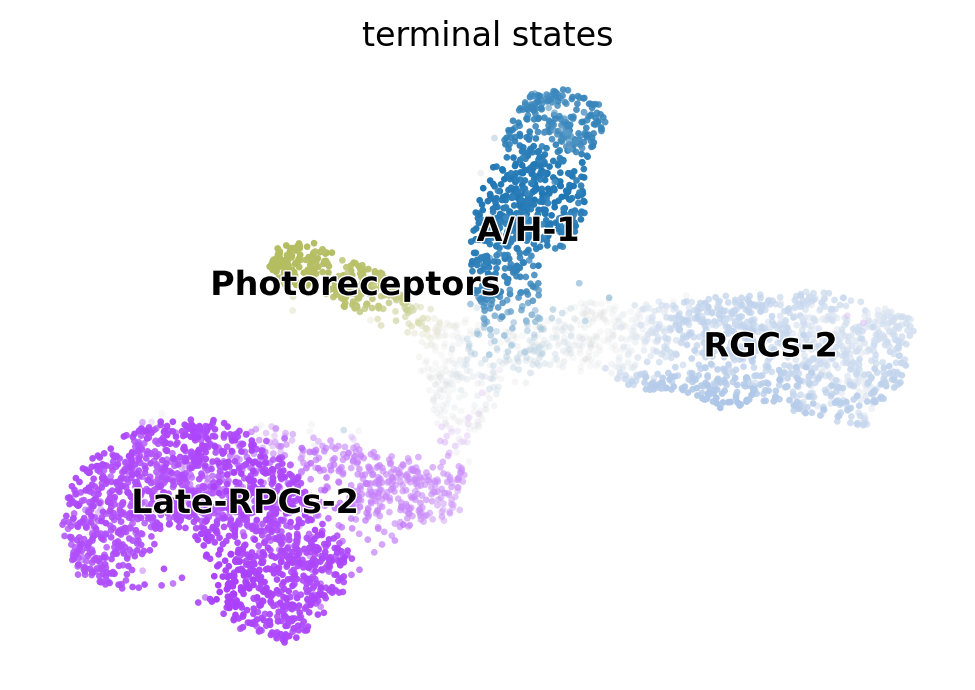

In [ ]:
cr.pl.terminal_states(adata)

### Initial statesの推定

細胞系譜の「初期」状態に該当する細胞集団を特定する。

Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


  0%|          | 0/4563 [00:00<?, ?cell/s]

Setting `softmax_scale=11.4320`


  0%|          | 0/4563 [00:00<?, ?cell/s]

    Finish (0:00:21)
Using a connectivity kernel with weight `0.5`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing eigendecomposition of the transition matrix
Adding `adata.uns['eigendecomposition_bwd']`
       `.eigendecomposition`
    Finish (0:00:00)
Computing Schur decomposition
Adding `adata.uns['eigendecomposition_bwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:01:25)
Computing `2` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:03)
Adding `adata.obs['initial_states']`
       `adata.obs['initial_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


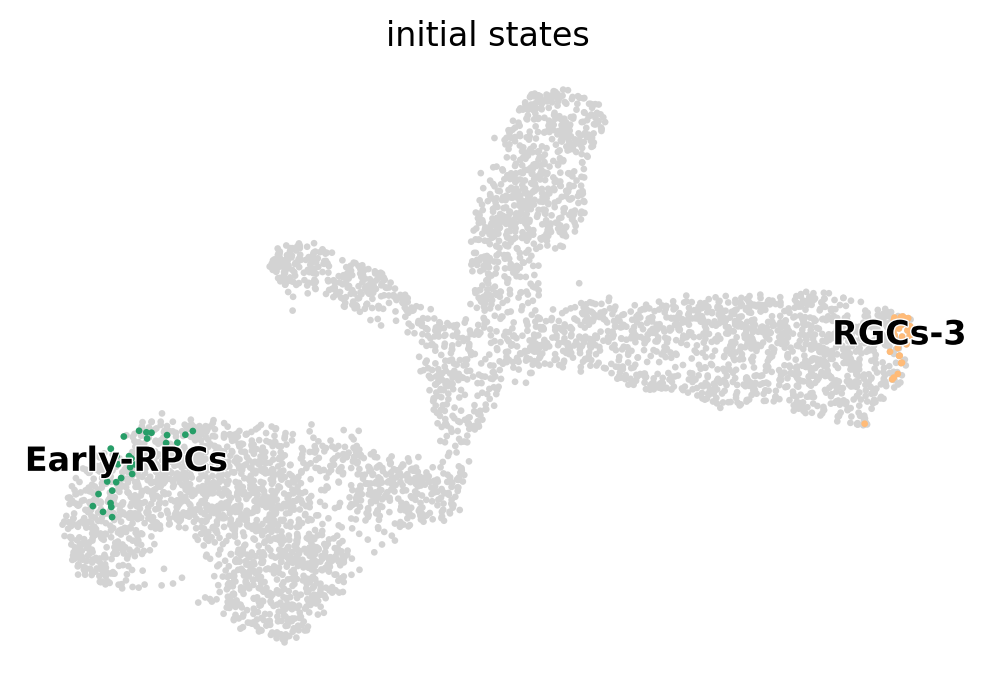

In [ ]:
cr.tl.initial_states(adata, 
                     cluster_key='leiden_celltypes', 
                     weight_connectivities=0.5,
                     force_recompute=True)
cr.pl.initial_states(adata, discrete=True)

### Fate mapの推定

推定された終端状態に向けて、それぞれの細胞が「どの終端にどれだけの確率で向かうか」を推定する。

Computing absorption probabilities
Defaulting to `'gmres'` solver.


  0%|          | 0/4 [00:00<?, ?/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:00)


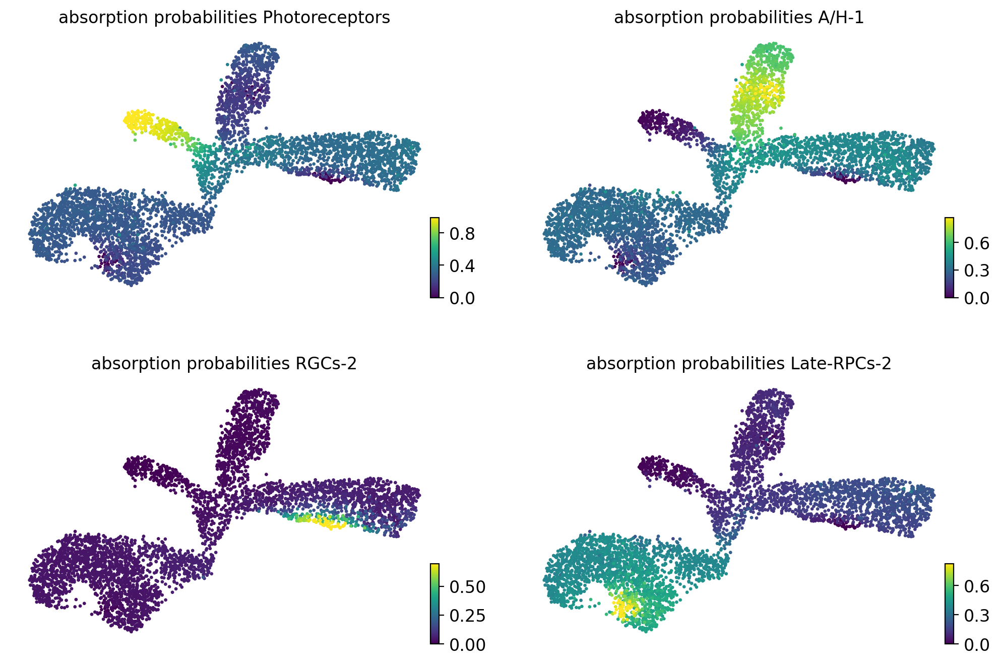

In [ ]:
cr.tl.lineages(adata)
cr.pl.lineages(adata, 
               ncols=2,
               same_plot=False)

### Lineage driverの推定

細胞系譜を駆動する遺伝子を見つける。

これは単純にピアソン相関でランキングしているらしい。それぞれの終端に向けた運命確率が計算済みなので、細胞ごとに運命確率と遺伝子発現量の相関を計算して、それが高い遺伝子が細胞系譜を駆動している、という仮定。

結果は全遺伝子について、それぞれの終端ごとの相関係数とピアソン相関のp-valueなどが入ったデータフレームとして出力される。

In [ ]:
cr.tl.lineage_drivers(adata,
    cluster_key='leiden_celltypes')

Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


,Photoreceptors_corr,Photoreceptors_pval,Photoreceptors_qval,Photoreceptors_ci_low,Photoreceptors_ci_high,A/H-1_corr,A/H-1_pval,A/H-1_qval,A/H-1_ci_low,A/H-1_ci_high,RGCs-2_corr,RGCs-2_pval,RGCs-2_qval,RGCs-2_ci_low,RGCs-2_ci_high,Late-RPCs-2_corr,Late-RPCs-2_pval,Late-RPCs-2_qval,Late-RPCs-2_ci_low,Late-RPCs-2_ci_high
Gngt2,0.745112,0.000000e+00,0.000000e+00,0.731920,0.757745,-0.375493,1.365282e-156,4.044876e-154,-0.400150,-0.350293,-0.111784,3.449270e-14,7.780992e-13,-0.140346,-0.083037,-0.297183,4.060074e-95,1.205543e-93,-0.323411,-0.270499
Crx,0.712120,0.000000e+00,0.000000e+00,0.697517,0.726133,-0.349280,7.302661e-134,1.622651e-131,-0.374501,-0.323543,-0.109484,1.144990e-13,2.470065e-12,-0.138062,-0.080725,-0.292434,5.562846e-92,1.591499e-90,-0.318746,-0.265672
Thrb,0.696499,0.000000e+00,0.000000e+00,0.681250,0.711143,-0.353159,4.406916e-137,1.012983e-134,-0.378299,-0.327498,-0.077315,1.682582e-07,1.923857e-06,-0.106094,-0.048407,-0.292106,9.114575e-92,2.596485e-90,-0.318424,-0.265339
Neurod4,0.677729,0.000000e+00,0.000000e+00,0.661725,0.693115,-0.243791,2.402379e-63,1.404760e-61,-0.270891,-0.216304,-0.128555,2.562241e-18,7.728461e-17,-0.156986,-0.099911,-0.356126,1.406067e-139,7.154841e-138,-0.381203,-0.330525
Gnb3,0.631526,0.000000e+00,0.000000e+00,0.613757,0.648656,-0.306964,8.863403e-102,1.125399e-99,-0.333014,-0.280445,-0.095509,9.852244e-11,1.623611e-09,-0.124181,-0.066677,-0.263219,4.883626e-74,1.086953e-72,-0.290020,-0.236005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Sox11,-0.331812,5.892248e-120,1.428281e-117,-0.357387,-0.305739,0.589021,0.000000e+00,0.000000e+00,0.569743,0.607652,0.219930,1.668259e-51,2.180513e-49,0.192140,0.247368,-0.412515,8.205192e-193,6.472877e-191,-0.436308,-0.388144
Ptma,-0.336004,3.309989e-123,8.486301e-121,-0.361496,-0.310010,0.299929,5.836837e-97,6.651001e-95,0.273291,0.326107,0.213032,2.448388e-48,2.720159e-46,0.185161,0.240562,-0.101739,5.423271e-12,2.430355e-11,-0.130370,-0.072937
Eno1,-0.356494,6.864972e-140,2.080086e-137,-0.381563,-0.330900,-0.147831,8.612988e-24,1.426439e-22,-0.176092,-0.119326,-0.017538,2.362375e-01,4.149017e-01,-0.046531,0.011484,0.527945,0.000000e+00,0.000000e+00,0.506690,0.548558
Dkk3,-0.399436,1.951912e-179,8.394481e-177,-0.423543,-0.374763,0.052400,3.975857e-04,1.357391e-03,0.023419,0.081293,-0.247076,4.362563e-65,9.087763e-63,-0.274128,-0.219635,0.502244,1.919639e-304,3.709076e-302,0.480226,0.523630


終端ごとにそれぞれの発現量をプロットしてみる。

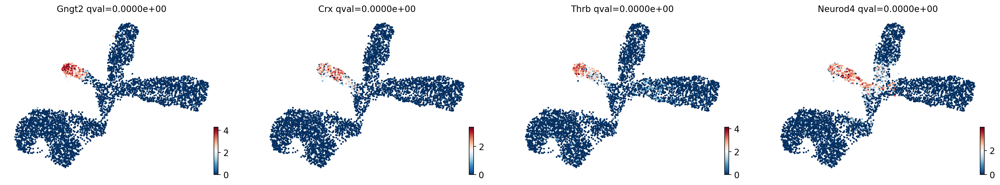

In [ ]:
cr.pl.lineage_drivers(adata,
    lineage='Photoreceptors', n_genes=4, ncols=4)

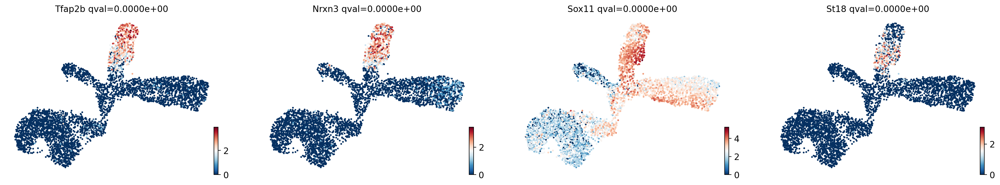

In [ ]:
cr.pl.lineage_drivers(adata,
    lineage='A/H-1', n_genes=4, ncols=4)

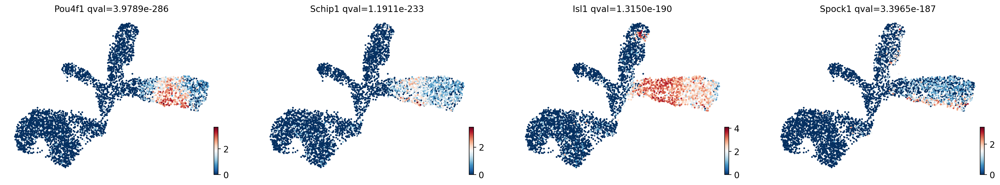

In [ ]:
cr.pl.lineage_drivers(adata,
    lineage='RGCs-2', n_genes=4, ncols=4)

### 遺伝子発現トレンド

細胞が辿る終端に向けた道筋の上で、遺伝子発現がどのようなトレンドで推移しているのかを計算し、プロットできる。

単純にscVeloで計算したlatent timeに対する全細胞の平均的な発現量を見るのではなく、それぞれの運命への所属確率で発現量を重み付けして表現している。

Computing trends using `1` core(s)


  0%|          | 0/3 [00:00<?, ?gene/s]

    Finish (0:00:01)
Plotting trends


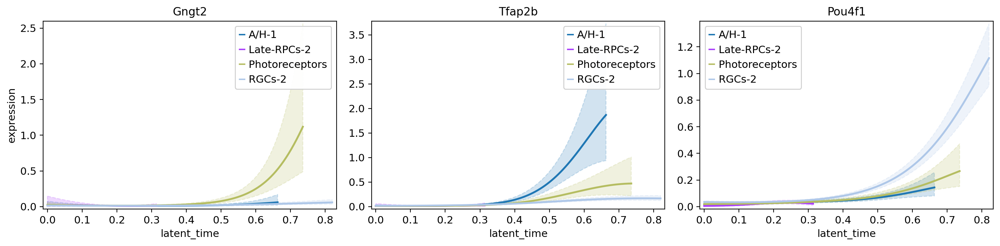

In [ ]:
model = cr.ul.models.GAM(adata)
cr.pl.gene_trends(
    adata,
    model=model,
    data_key='X',
    genes=['Gngt2', 'Tfap2b', 'Pou4f1'],
    ncols=3,
    time_key="latent_time",
    same_plot=True,
    hide_cells=True,
    figsize=(15, 4),
    n_test_points=200)

また、lineage driverとして特定された複数の遺伝子の発現トレンドの推移をヒートマップとしてプロットすることもできる。

Computing trends using `1` core(s)


  0%|          | 0/100 [00:00<?, ?gene/s]

    Finish (0:00:10)


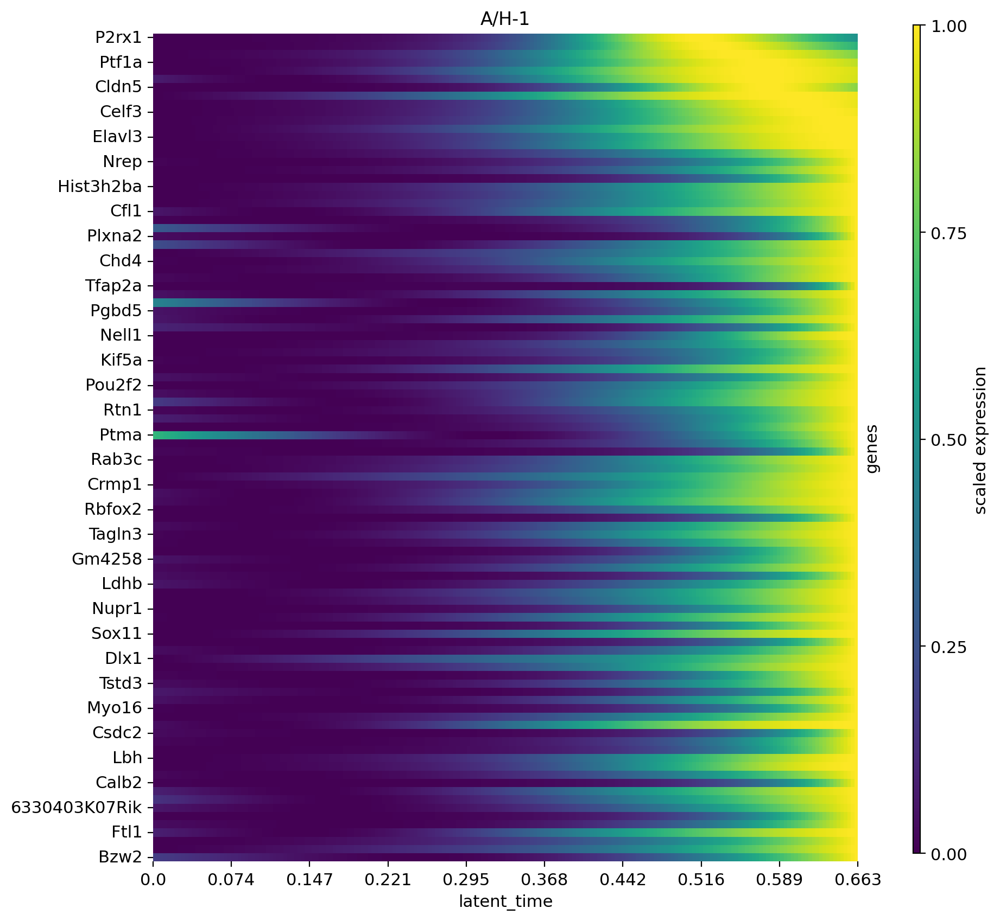

In [ ]:
cr.pl.heatmap(
    adata,
    model,
    genes=adata.varm['terminal_lineage_drivers']['A/H-1_corr'].sort_values(ascending=False).index[:100],
    lineages='A/H-1')